In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt



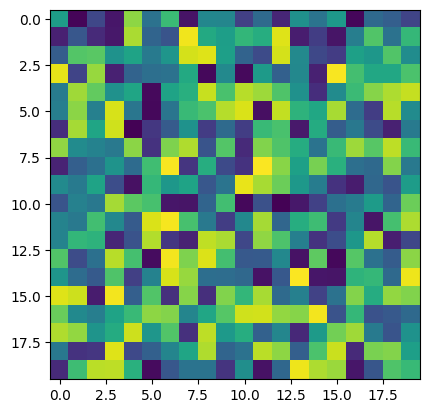

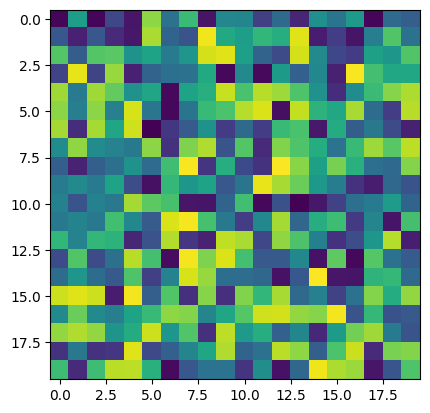

In [ ]:
#Linear Filtering

#shift pixels by one

img= np.random.randint(0,255,size=[20,20], dtype='uint8')
kernel = np.array([[0,0,0],[1,0,0],[0,0,0]])
output = cv2.filter2D(img,-1,kernel)

plt.imshow(img, cmap='viridis', vmin=0, vmax=255)
plt.title("original")
plt.show()

plt.imshow(output, cmap='viridis', vmin=0, vmax=255)
plt.title("Shift pixels by 1")
plt.show()

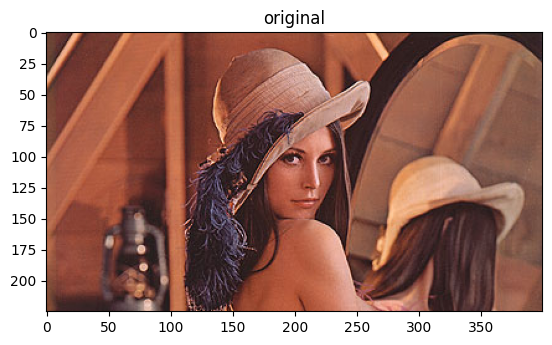

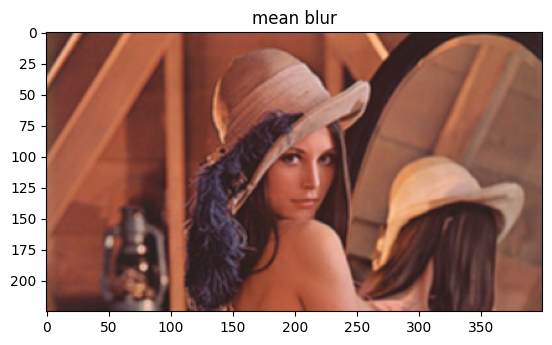

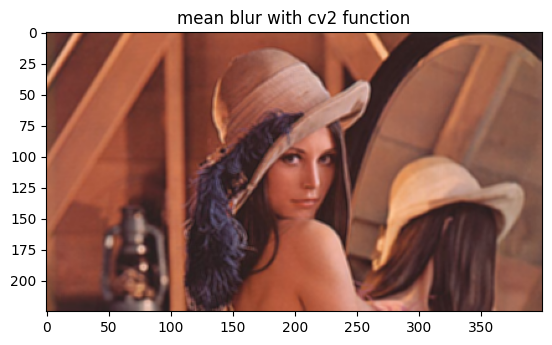

In [9]:
#mean filter
imBGR = cv2.imread("images/lena.jpg")
imRGB = cv2.cvtColor(imBGR,cv2.COLOR_BGR2RGB)

kernel = np.array([[1,1,1],[1,1,1],[1,1,1]])/9

output = cv2.filter2D(imRGB,-1,kernel)

plt.imshow(imRGB)
plt.title("original")
plt.show()

plt.imshow(output)
plt.title("mean blur")
plt.show()

#using a more high level mean blur using opencv

blur=cv2.blur(imRGB,(3,3))
plt.imshow(blur)
plt.title("mean blur with cv2 function")
plt.show()

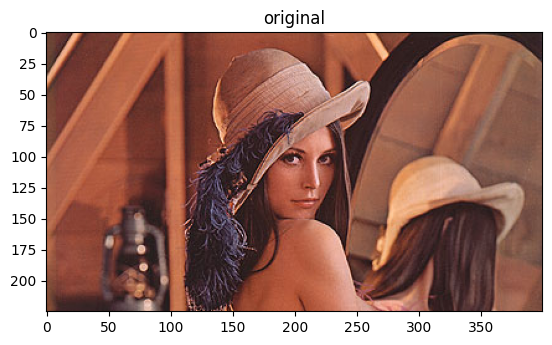

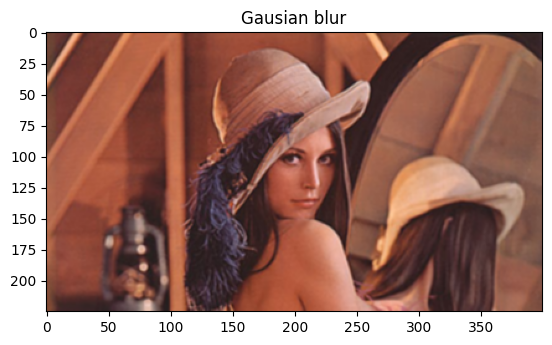

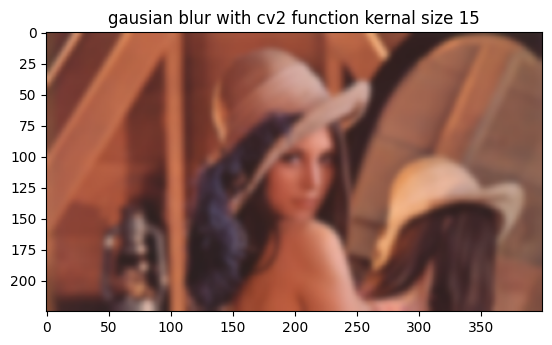

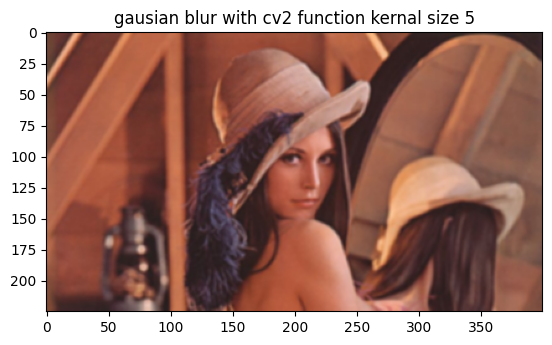

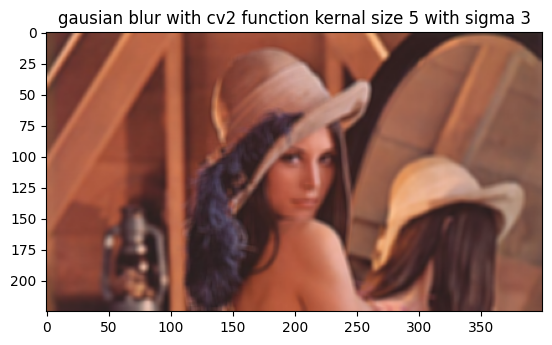

In [17]:
#Gausian filter
imBGR = cv2.imread("images/lena.jpg")
imRGB = cv2.cvtColor(imBGR,cv2.COLOR_BGR2RGB)

kernel = np.array([[1,2,1],[2,4,2],[1,2,1]])/16

output = cv2.filter2D(imRGB,-1,kernel)

plt.imshow(imRGB)
plt.title("original")
plt.show()

plt.imshow(output)
plt.title("Gausian blur")
plt.show()


kernelsize=(15,15)
blur=cv2.GaussianBlur(imRGB,ksize=kernelsize, sigmaX=0, sigmaY=0)
plt.imshow(blur)
plt.title("gausian blur with cv2 function kernal size 15")
plt.show()

kernelsize=(5,5)
blur=cv2.GaussianBlur(imRGB,ksize=kernelsize, sigmaX=0, sigmaY=0)
plt.imshow(blur)
plt.title("gausian blur with cv2 function kernal size 5")
plt.show()

kernelsize=(5,5)
blur=cv2.GaussianBlur(imRGB,ksize=kernelsize, sigmaX=3, sigmaY=3)
plt.imshow(blur)
plt.title("gausian blur with cv2 function kernal size 5 with sigma 3")
plt.show()


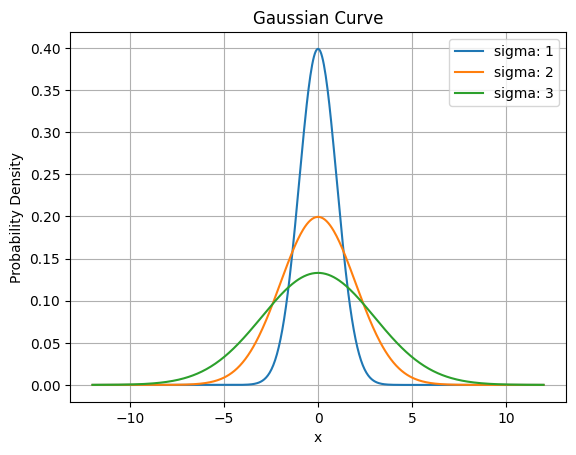

In [15]:
# Parameters of the Gaussian
mu = 0       # mean
sigmas = [1,2,3]    # standard deviation
 
# Generate x values
x = np.linspace(mu - 4*max(sigmas), mu + 4*max(sigmas), 500)
 
# Gaussian formula
for sigma in sigmas:
    y = (1 / (sigma * np.sqrt(2 * np.pi))) * np.exp(-((x - mu)**2) / (2 * sigma**2))
    plt.plot(x, y,label=f"sigma: {sigma}")

 
# Plot
plt.title("Gaussian Curve")
plt.xlabel("x")
plt.ylabel("Probability Density")
plt.grid(True)
plt.legend()
plt.show()

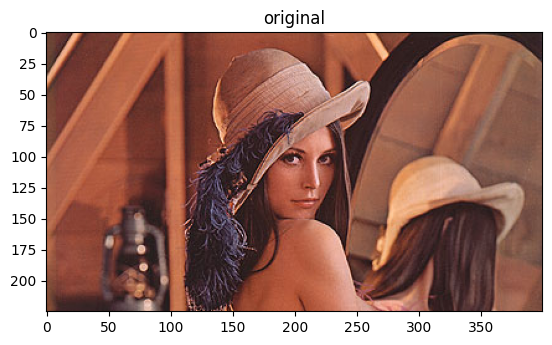

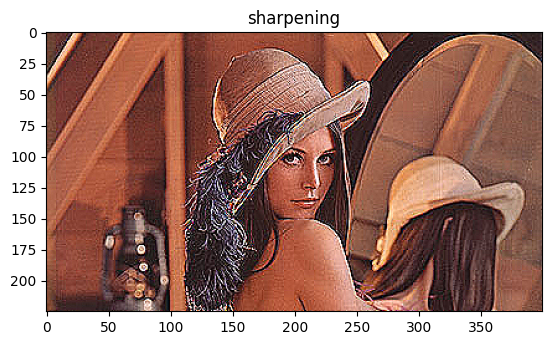

In [19]:
#High Pass Filter Sharpening 
imBGR = cv2.imread("images/lena.jpg")
imRGB = cv2.cvtColor(imBGR,cv2.COLOR_BGR2RGB)

kernel = np.array([[0,-1,0],[-1,5,-1],[0,-1,0]])

output = cv2.filter2D(imRGB,-1,kernel)

plt.imshow(imRGB)
plt.title("original")
plt.show()

plt.imshow(output)
plt.title("sharpening")
plt.show()


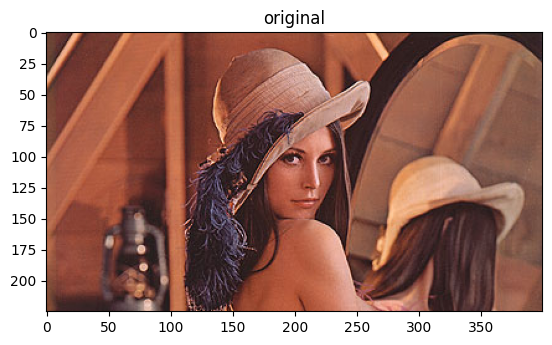

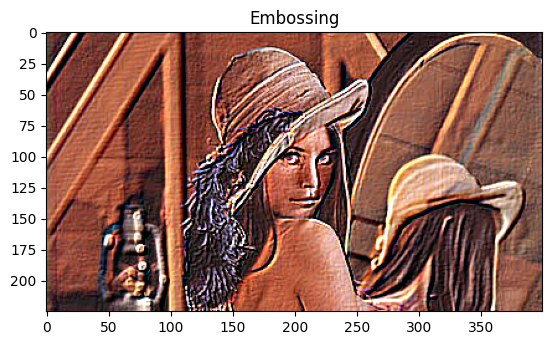

In [20]:
#High Pass Filter embossing
imBGR = cv2.imread("images/lena.jpg")
imRGB = cv2.cvtColor(imBGR,cv2.COLOR_BGR2RGB)

kernel = np.array([[-2,-1,0],[-1,1,1],[0,1,2]])

output = cv2.filter2D(imRGB,-1,kernel)

plt.imshow(imRGB)
plt.title("original")
plt.show()

plt.imshow(output)
plt.title("Embossing")
plt.show()

Non-linear Filters:
 
Median filter - effective for salt and pepper
 
The principle of the median filter is to replace the gray level of each pixel by the median of the gray levels in a neighborhood of the pixels, instead of using the average operation.
 
Linear filtering is the filtering method in which the value of output pixel is linear combinations of the neighbouring input pixels. it can be done with convolution.For examples, mean/average filters or Gaussian filtering.
A non-linear filtering is one that cannot be done with convolution or Fourier multiplication. A sliding median filter is a simple example of a non-linear filter.

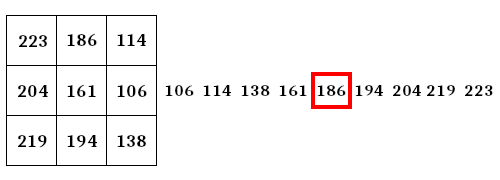

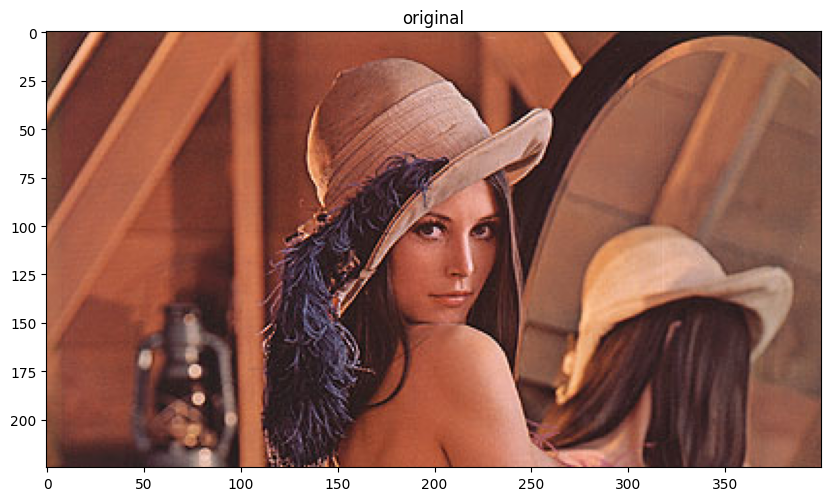

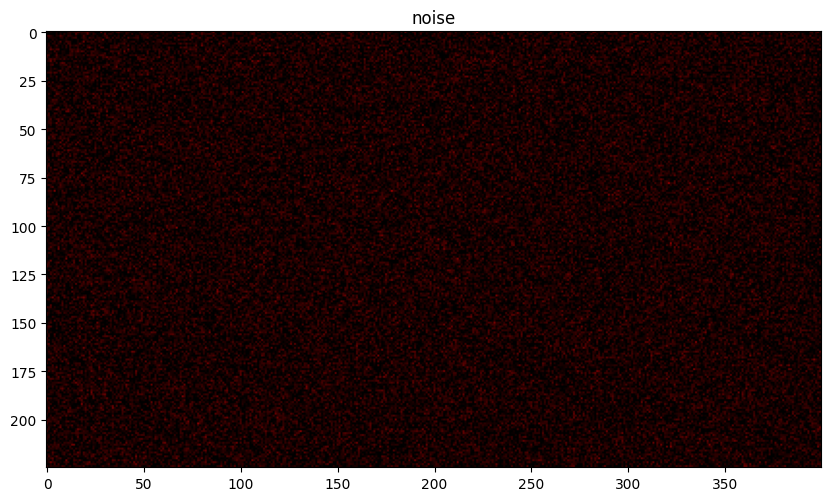

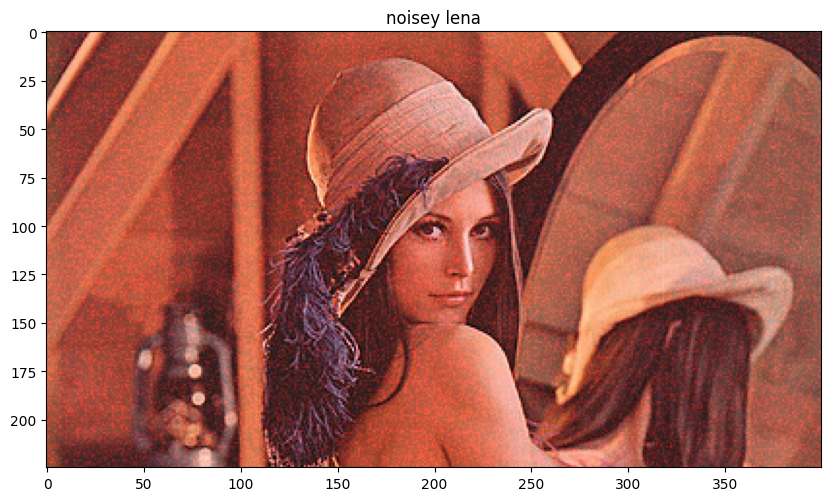

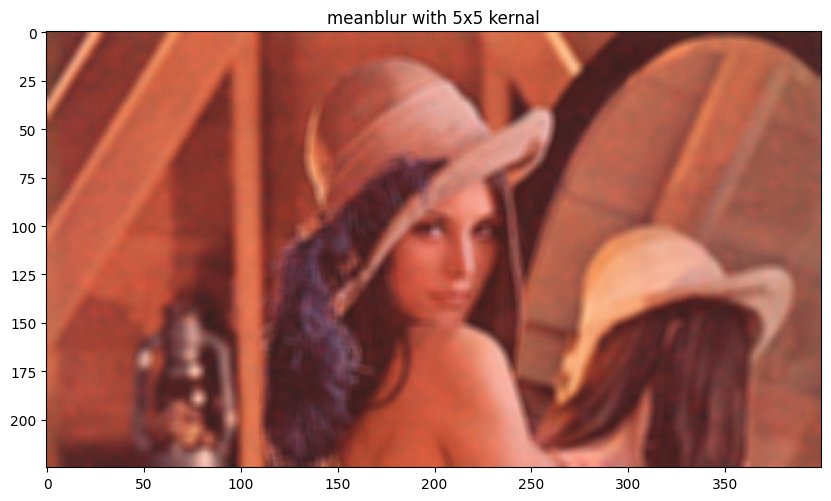

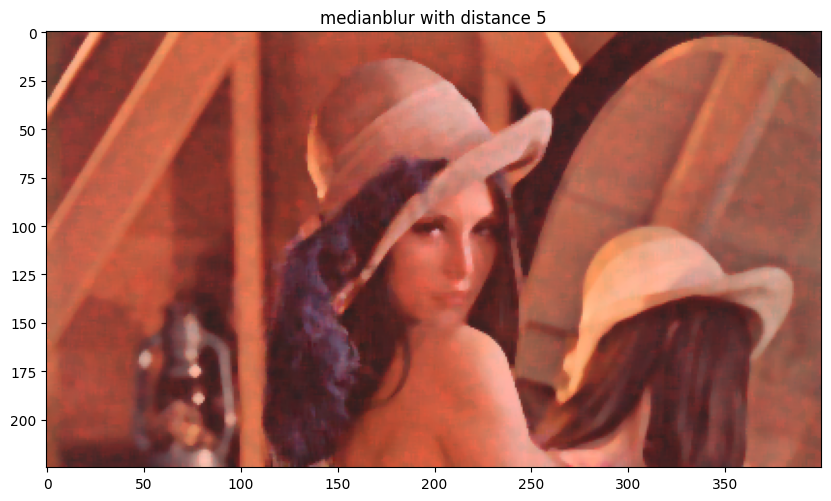

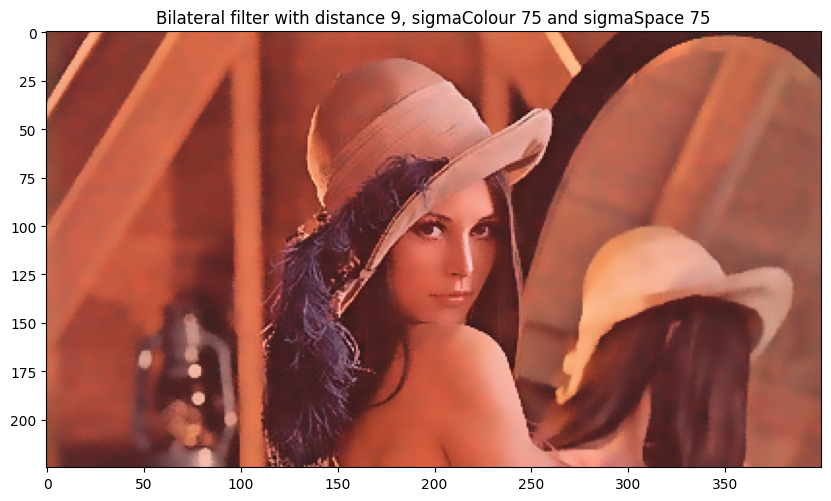

In [9]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

imBGR = cv2.imread("images/lena.jpg")
imRGB = cv2.cvtColor(imBGR,cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10,10))
plt.imshow(imRGB)
plt.title("original")
plt.show()

#add gaussian noise on the red channel

im = np.zeros(imRGB.shape, np.uint8)
mean = 20
sigma= 30
cv2.randn(im, mean, sigma)

plt.figure(figsize=(10,10))
plt.imshow(im)
plt.title("noise")
plt.show()

imgRGB_Noised = cv2.add(imRGB,im)
plt.figure(figsize=(10,10))
plt.imshow(imgRGB_Noised)
plt.title("noisey lena")
plt.show()

meanblur = cv2.blur(imgRGB_Noised,(5,5))
plt.figure(figsize=(10,10))
plt.imshow(meanblur)
plt.title("meanblur with 5x5 kernal")
plt.show()

medianblur=cv2.medianBlur(imgRGB_Noised,5)
plt.figure(figsize=(10,10))
plt.imshow(medianblur)
plt.title("medianblur with distance 5")
plt.show()

bilblur=cv2.bilateralFilter(imgRGB_Noised,9,75,75)
plt.figure(figsize=(10,10))
plt.imshow(bilblur)
plt.title("Bilateral filter with distance 9, sigmaColour 75 and sigmaSpace 75")
plt.show()


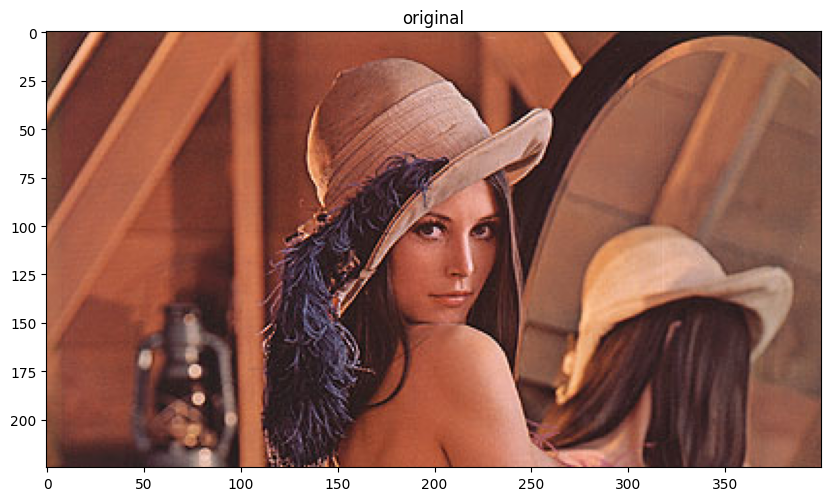

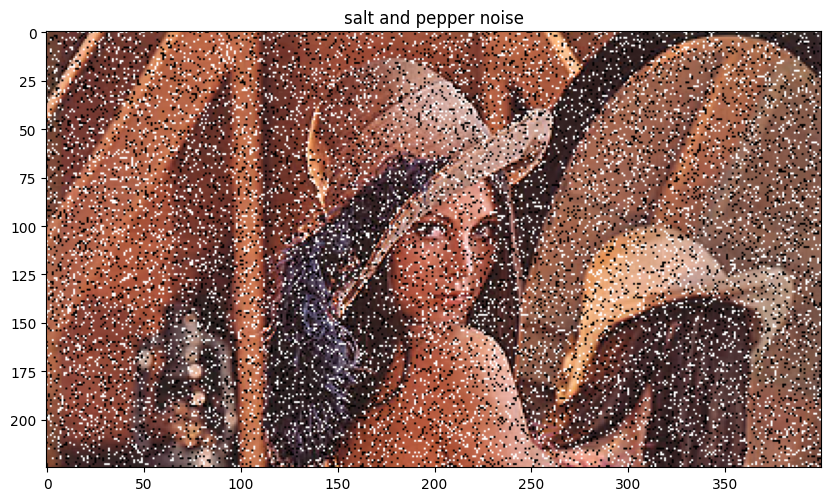

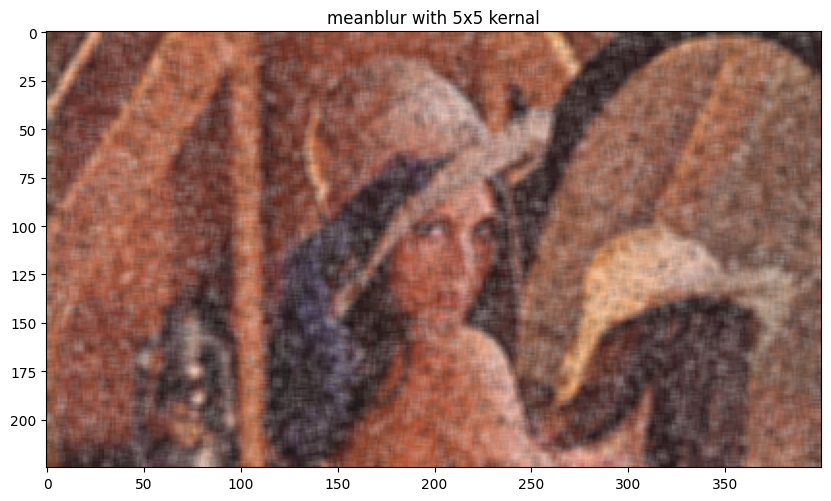

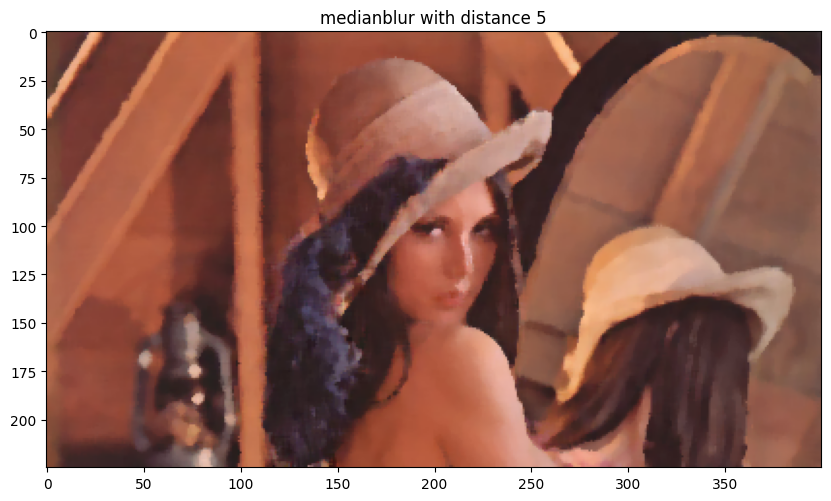

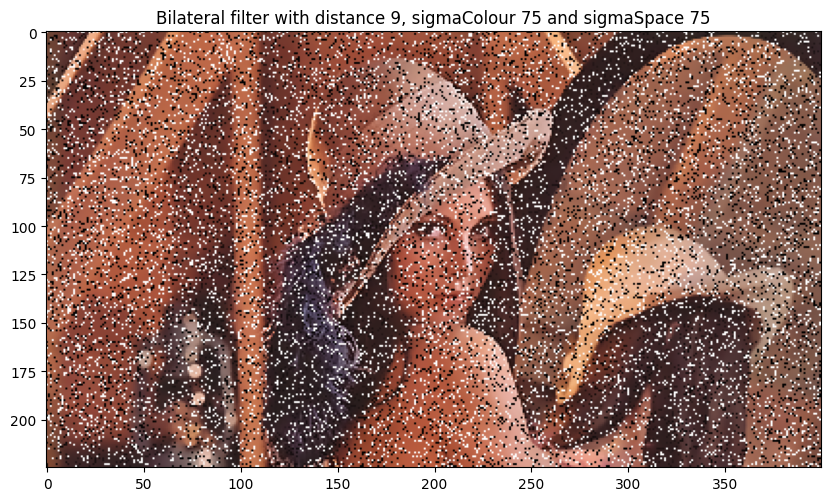

In [11]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

imBGR = cv2.imread("images/lena.jpg")
imRGB = cv2.cvtColor(imBGR,cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10,10))
plt.imshow(imRGB)
plt.title("original")
plt.show()


def addsalt_pepper(img, SNR):
    img_ = img.copy()
    c, h, w = img_.shape
    mask = np.random.choice((0, 1, 2), size=(1, h, w), p=[SNR, (1 - SNR) / 2., (1 - SNR) / 2.])
    mask = np.repeat(mask, c, axis=0)
    img_[mask == 1] = 255 # salt noise
    img_[mask == 2] = 0 #
    return img_

im_noise = addsalt_pepper(imRGB.transpose(2, 1, 0), 0.8)
im_noise = im_noise.transpose(2,1,0)

plt.figure(figsize=(10,10))
plt.imshow(im_noise)
plt.title("salt and pepper noise")
plt.show()


meanblur = cv2.blur(im_noise,(5,5))
plt.figure(figsize=(10,10))
plt.imshow(meanblur)
plt.title("meanblur with 5x5 kernal")
plt.show()

medianblur=cv2.medianBlur(im_noise,5)
plt.figure(figsize=(10,10))
plt.imshow(medianblur)
plt.title("medianblur with distance 5")
plt.show()

bilblur=cv2.bilateralFilter(im_noise,9,75,75)
plt.figure(figsize=(10,10))
plt.imshow(bilblur)
plt.title("Bilateral filter with distance 9, sigmaColour 75 and sigmaSpace 75")
plt.show()

